<a href="https://colab.research.google.com/github/Varnez/final-degree-project/blob/master/notebooks/PictorialGAN_ClaudeMonet_pytorch.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import os

import random

from datetime import datetime

import numpy as np

import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.autograd as autograd
import torch.nn.functional as F
import torch.optim as optim

import torchvision.utils as vutils


MODEL_STORAGE_DIR = "pictorialgan_storage"

In [ ]:
dataset_path = "../input/claude-monet-pictorial-works-dataset-wikiart"
    


files = []

for r, d, f in os.walk(dataset_path):
    for file in f:
        if '.png' in file:
            files.append(os.path.join(r, file))


In [ ]:
dataset = []

for file in files:
    dataset.append(plt.imread(file))

dataset = np.array(dataset)[:,:,:,:3]


In [ ]:
print(torch.cuda.is_available())

True


In [ ]:
class Generator(nn.Module):
    def __init__(self, filter_sizes, leaky_relu_alpha, input_lantent_vector_size, bias=True, bnorm_affine=True):
        super(Generator, self).__init__()
      
        # Network architecture
        # Input Tconv | out:[4 x 4 x 1024]
        self.input = nn.Sequential(
            nn.ConvTranspose2d(in_channels=input_lantent_vector_size, out_channels=filter_sizes[0], kernel_size=4, stride=1, padding=0, bias=bias),
            nn.BatchNorm2d(num_features=filter_sizes[0], affine=bnorm_affine),
            nn.ReLU(inplace=True))
        
        # Hidden Tconv 1 | out:[8 x 8 x 512]
        self.hidden_tconv_1 = nn.Sequential(
            nn.ConvTranspose2d(in_channels=filter_sizes[0], out_channels=filter_sizes[1], kernel_size=4, stride=2, padding=1, bias=bias),
            nn.BatchNorm2d(num_features=filter_sizes[1], affine=bnorm_affine),
            nn.ReLU(inplace=True))

        # Input Tconv 2 | out:[16 x 16 x 256]
        self.hidden_tconv_2 = nn.Sequential(
            nn.ConvTranspose2d(in_channels=filter_sizes[1], out_channels=filter_sizes[2], kernel_size=4, stride=2, padding=1, bias=bias),
            nn.BatchNorm2d(num_features=filter_sizes[2], affine=bnorm_affine),
            nn.ReLU(inplace=True))
        
        # Input Tconv 3 | out:[32 x 32 x 128]
        self.hidden_tconv_3 = nn.Sequential(
            nn.ConvTranspose2d(in_channels=filter_sizes[2], out_channels=filter_sizes[3], kernel_size=4, stride=2, padding=1, bias=bias),
            nn.BatchNorm2d(num_features=filter_sizes[3], affine=bnorm_affine),
            nn.ReLU(inplace=True))
        
        # Input Tconv 4 | out:[64 x 64 x 64]
        self.hidden_tconv_4 = nn.Sequential(
            nn.ConvTranspose2d(in_channels=filter_sizes[3], out_channels=filter_sizes[4], kernel_size=4, stride=2, padding=1, bias=bias),
            nn.BatchNorm2d(num_features=filter_sizes[4], affine=bnorm_affine),
            nn.ReLU(inplace=True))
        
        # Input Tconv 5 | out:[128 x 128 x 32]
        self.hidden_tconv_5 = nn.Sequential(
            nn.ConvTranspose2d(in_channels=filter_sizes[4], out_channels=filter_sizes[5], kernel_size=4, stride=2, padding=1, bias=bias),
            nn.BatchNorm2d(num_features=filter_sizes[5], affine=bnorm_affine),
            nn.ReLU(inplace=True))

        # Output Tconv | out:[256 x 256 x 3]
        self.output = nn.Sequential(
            nn.ConvTranspose2d(in_channels=filter_sizes[5], out_channels=3, kernel_size=4, stride=2, padding=1, bias=bias),
            nn.Tanh())
        
        self.input_lantent_vector_size = input_lantent_vector_size

    def forward(self, x):
        features = self.input(x)
        
        features = self.hidden_tconv_1(features)
        features = self.hidden_tconv_2(features)
        features = self.hidden_tconv_3(features)
        features = self.hidden_tconv_4(features)
        features = self.hidden_tconv_5(features)

        output = self.output(features)

        return output
    
class Critic(nn.Module):
    def __init__(self, filter_sizes, leaky_relu_alpha, bias=True):
        super(Critic, self).__init__()

        # Network architecture
        # Input conv | out:[128 x 128 x 32]
        self.input = nn.Sequential (
            nn.Conv2d(in_channels=3, out_channels=filter_sizes[0], kernel_size=4, stride=2, padding=1, bias=bias),
            nn.LeakyReLU(leaky_relu_alpha, inplace=True))
        
        # Hidden conv 1 | out:[64 x 64 x 64]
        self.hidden_conv_1 = nn.Sequential(
            nn.Conv2d(in_channels=filter_sizes[0], out_channels=filter_sizes[1], kernel_size=4, stride=2, padding=1, bias=bias),
            nn.LeakyReLU(leaky_relu_alpha, inplace=True))
        
        # Hidden conv 2  | out:[32 x 32 x 128]
        self.hidden_conv_2 = nn.Sequential(
            nn.Conv2d(in_channels=filter_sizes[1], out_channels=filter_sizes[2], kernel_size=4, stride=2, padding=1, bias=bias),
            nn.LeakyReLU(leaky_relu_alpha, inplace=True))
        
        # Hidden conv 3 | out:[16 x 16 x 256]
        self.hidden_conv_3 = nn.Sequential(
            nn.Conv2d(in_channels=filter_sizes[2], out_channels=filter_sizes[3], kernel_size=4, stride=2, padding=1, bias=bias),
            nn.LeakyReLU(leaky_relu_alpha, inplace=True))
        
        # Hidden conv 4 | out:[8 x 8 x 512]
        self.hidden_conv_4 = nn.Sequential(
            nn.Conv2d(in_channels=filter_sizes[3], out_channels=filter_sizes[4], kernel_size=4, stride=2, padding=1, bias=bias),
            nn.LeakyReLU(leaky_relu_alpha, inplace=True))
        
        # Hidden conv 5  | out:[4 x 4 x 1024]
        self.hidden_conv_5 = nn.Sequential(
            nn.Conv2d(in_channels=filter_sizes[4], out_channels=filter_sizes[5], kernel_size=4, stride=2, padding=1, bias=bias),
            nn.LeakyReLU(leaky_relu_alpha, inplace=True))
        
        
        # Out conv | out:[1 x 1 x 1]
        self.output = nn.Sequential(
            nn.Conv2d(in_channels=filter_sizes[5], out_channels=1, kernel_size=4, stride=1, padding=0, bias=bias))



    def forward(self, x):
        features = self.input(x)

        features = self.hidden_conv_1(features)
        features = self.hidden_conv_2(features)
        features = self.hidden_conv_3(features)
        features = self.hidden_conv_4(features)
        features = self.hidden_conv_5(features)

        output = self.output(features)

        return output
        

class PictorialGan():
    def __init__(self, gen_filters = (1024, 512, 256, 128, 64, 32), 
                 disc_filters = (32, 64, 128, 256, 512, 1024), 
                 input_latent_vector_size=100, 
                 n_critic=5, n_generator=1, 
                 gradient_penalty_lambda=10, 
                 learning_rate=1e-4,
                 optimizer_betas=(0.,0.9),
                 leaky_relu_alpha=0.2,
                 seed=42,
                 cuda=True,
                 verbose=False):
        
        # Control parameters
        self.cuda = cuda
        self.verbose = verbose
        
        # Training parameters
        self.epoch = 0
        self.real_label = 1
        self.synth_label = -1
        
        self.n_critic = n_critic
        self.n_generator = n_generator
        self.gradient_penalty_lambda = gradient_penalty_lambda
        self.input_latent_vector_size = input_latent_vector_size
        
        self.generator_losses = []
        self.critic_losses = []

        # Submodels instanciation
        self.G = Generator(gen_filters, leaky_relu_alpha=leaky_relu_alpha, input_lantent_vector_size=input_latent_vector_size)
        self.D = Critic(disc_filters, leaky_relu_alpha=leaky_relu_alpha)

        self.G = self._cuda(self.G)
        self.D = self._cuda(self.D)
        
        self.optimizer_generator = optim.Adam(self.G.parameters(), lr=learning_rate, betas=optimizer_betas)
        self.optimizer_critic = optim.Adam(self.D.parameters(), lr=learning_rate, betas=optimizer_betas)
        
        # Tensors to control the sign of the gradients during backward propagation
        self._one = self._cuda(torch.tensor(1, dtype=torch.float))
        self._mone = self._cuda(self._one * -1)
        
        # Random seed values, to provide reproducibility
        random.seed(seed)
        torch.manual_seed(seed)

        torch.backends.cudnn.deterministic = True
        torch.backends.cudnn.benchmark = False

    
    def load_model_checkpoint(self, checkpoint_path='pictorialgan_storage/checkpoint/checkpoint.pickle'):
        checkpoint = torch.load(checkpoint_path)

        self.G.load_state_dict(checkpoint['generator'])
        self.D.load_state_dict(checkpoint['critic'])
        self.optimizer_generator.load_state_dict(checkpoint['optimizer_generator'])
        self.optimizer_critic.load_state_dict(checkpoint['optimizer_critic'])

        self.epoch = checkpoint['epoch']
        self.generator_losses = checkpoint['generator_losses']
        self.critic_losses = checkpoint['critic_losses']
    
    
    def store_model_checkpoint(self, storage_path='pictorialgan_storage/checkpoint/checkpoint.pickle'):
        storage_dict = {'epoch': self.epoch,
                        'generator_losses': self.generator_losses,
                        'critic_losses' : self.critic_losses,
                        'generator': self.G.state_dict(),
                        'critic': self.D.state_dict(),
                        'optimizer_generator': self.optimizer_generator.state_dict(),
                        'optimizer_critic': self.optimizer_critic.state_dict()}

        torch.save(storage_dict, storage_path)
        
        
    def image_visualization_pretreatment(self, img):
        min = img.min()
        max = img.max()

        if not (min == 0 and img.max == 0):
            img -= min
            img /= max - min

        return img
        
        
    def visualize_batch(self, batch, save=False, epoch=0):
        batch = self.image_visualization_pretreatment(batch)
        plt.figure(figsize=(25,25))
        plt.axis("off")
        plt.imshow(np.transpose(vutils.make_grid(batch, padding=2, normalize=False), (1,2,0)))

        if save:
            if not os.path.exists('./output/synth_imgs'):
                os.makedirs('./output/synth_imgs')

            plt.savefig("output/synth_imgs/{} : epoch {}.png".format(datetime.now().strftime("%H:%M:%S"), epoch))

        plt.show()
    
    
    def generate_picture(self, batch_size=1, path=None):
        if path is None:
            
            if not os.path.exists('./output/synth_imgs'):
                os.makedirs('./output/synth_imgs')
            
            path = 'output/synth_imgs/{}'.format(format(datetime.now().strftime("%H:%M:%S")))
        
        input_latent_vector = self._cuda(torch.randn(batch_size, self.input_latent_vector_size, 1, 1))
        
        synth_images = self.G(input_latent_vector).cpu().detach().numpy()
        
        for i in range(batch_size):
            synth_image = self.image_visualization_pretreatment(synth_images[i])
            synth_image = np.transpose(synth_image, (1,2,0))
            
            img_path = "{}_{:04d}.png".format(path, i)
            plt.imsave(img_path, synth_image)
    
                                                     
    def train_generator(self, batch_size):
        for p in self.D.parameters():
            p.requires_grad = False

        # Data preparation
        input_latent_vector = self._cuda(torch.randn(batch_size, self.input_latent_vector_size, 1, 1))
        
        synth_batch = self.G(input_latent_vector)
        synth_batch = self._cuda(synth_batch)

        # Gradient values cleaning
        self.G.zero_grad()

        # Batch processing
        output = self.D(synth_batch).view(-1)

        # Loss calculation
        loss = output.mean()

        # Gradient calculation
        loss.backward(self._mone)

        # Weight update (Learning happening!)
        self.optimizer_generator.step()

        return loss.item()

                                                     
    def train_critic(self, real_batch, batch_size):
        for p in self.D.parameters():
            p.requires_grad = True

        # Data preparation
        input_latent_vector = self._cuda(torch.randn(batch_size, self.input_latent_vector_size, 1, 1))

        synth_batch = self.G(input_latent_vector)
        synth_batch = self._cuda(synth_batch)

        # Gradient values cleaning
        self.D.zero_grad()

        # Batch processing
        output = self.D(real_batch).view(-1)

        # Loss calculation
        loss_real = output.mean()

        # Gradient calculation
        loss_real.backward(self._mone)

        # Batch processing
        output = self.D(synth_batch).view(-1)

        # Loss calculation
        loss_synth = output.mean()

        # Gradient calculation
        loss_synth.backward(self._one)
        
        # Gradient Penalty term calculation
        gradient_penalty = self.calculate_gradient_penalty(real_batch, synth_batch, batch_size)
        
        # Gradient Penalty term propagation
        gradient_penalty.backward()

        # Weight update (Learning happening!)
        self.optimizer_critic.step()

        return loss_synth.item() - loss_real.item() + gradient_penalty.item() 
    
                                                     
    def calculate_gradient_penalty(self, real_data, synth_data, batch_size):
        alpha = torch.FloatTensor(batch_size,1,1,1).uniform_(0,1)
        alpha = self._cuda(alpha.expand(batch_size, real_data.size(1), real_data.size(2), real_data.size(3)))

        interpolated = self._cuda(alpha * real_data + ((1 - alpha) * synth_data))
        interpolated = autograd.Variable(interpolated, requires_grad=True)

        interpolated_pred = self.D(interpolated)

        grad_outputs = self._cuda(torch.ones(interpolated_pred.size()))

        gradients = autograd.grad(outputs=interpolated_pred, inputs=interpolated,
                                  grad_outputs=grad_outputs, create_graph=True, 
                                  retain_graph=True, only_inputs=True)[0]

        gradient_penalty = ((gradients.norm(2, dim=1) - 1) ** 2).mean() * self.gradient_penalty_lambda

        return gradient_penalty
    
    
    def train(self, train_dataset, epochs, batch_size=64, visualize_interval=100, checkpoint_interval=100):
        real_images = torch.from_numpy(np.transpose(train_dataset, (0,3,1,2))).float()
        real_images = self._cuda(self._normalize_real_images(real_images))
        
        self.fixed_input_vector = self._cuda(torch.randn(batch_size, self.input_latent_vector_size, 1, 1))
        
        iters_per_epoch = len(real_images) // (batch_size * self.n_critic)

        start_time = datetime.now()

        checkpoint_path = os.path.join(MODEL_STORAGE_DIR, 'checkpoint')
        os.makedirs(checkpoint_path, exist_ok=True)

        print("Training log: Start [{}]".format(start_time.strftime("%H:%M:%S")))

        for epoch in range(self.epoch, epochs+1):
            epoch_idx = torch.randperm(real_images.size(0))
            epoch_start_time = datetime.now()

            for i in range(iters_per_epoch):

                for j in range(self.n_critic):
                    iter_idx = epoch_idx[(i+j)*batch_size : (i+j+1)*batch_size]
                    real_batch = real_images[iter_idx]

                    loss_critic = self.train_critic(real_batch, batch_size)

                for _ in range(self.n_generator):
                    loss_generator = self.train_generator(batch_size)

            self.generator_losses.append(loss_generator)
            self.critic_losses.append(loss_critic)

            if epoch % visualize_interval == 0:
                elapsed_time =  "\nEpoch elapsed time: {} [Total elapsed time {}]".format(datetime.now() - epoch_start_time, datetime.now() - start_time)
                losses_print = "\nGenerator loss: {} \nWasserstein loss: {}".format(loss_generator, loss_critic)

                print("Training log: Epoch {} done [{}]{}{}".format(epoch, datetime.now().strftime("%H:%M:%S"), elapsed_time, losses_print))

                # Visualize status of generation
                visualization_batch = self.G(self.fixed_input_vector)
                self.visualize_batch(visualization_batch.cpu().detach(), True, epoch)

            if epoch % checkpoint_interval == 0:
                storage_path = os.path.join(checkpoint_path, "checkpoint.pickle")
                self.store_model_checkpoint(storage_path)
                
            self.epoch += 1
            
            torch.cuda.empty_cache()
    
    #######################################
    ## Auxiliar functions
    #######################################
    def _weights_init(self, m):
        classname = m.__class__.__name__
        if classname.find('Conv2d') != -1:
            nn.init.normal_(m.weight.data, 0.0, 0.02)
        elif classname.find('BatchNorm2d') != -1 and m.weight is not None:
            nn.init.normal_(m.weight.data, 1.0, 0.02)
            nn.init.constant_(m.bias.data, 0)
            
    def _cuda(self, x):
        if self.cuda and torch.cuda.is_available():
            x = x.cuda()

        return x
    
    def _normalize_real_images(self, real_images):
        min_value = real_images.min()
        max_value = real_images.max()

        normalized_images = 2 * (real_images - min_value) / (max_value - min_value) - 1

        return normalized_images

In [ ]:
model = PictorialGan()

model.load_model_checkpoint('../input/pictorialgan-claudie-monet-weights-train/checkpoint_32000.pickle')

Training log: Start [07:14:38]
Training log: Epoch 32500 done [08:36:15]
Epoch elapsed time: 0:00:17.944846 [Total elapsed time 1:21:37.060643]
Generator loss: -6927659.0 
Wasserstein loss: -16036915.0


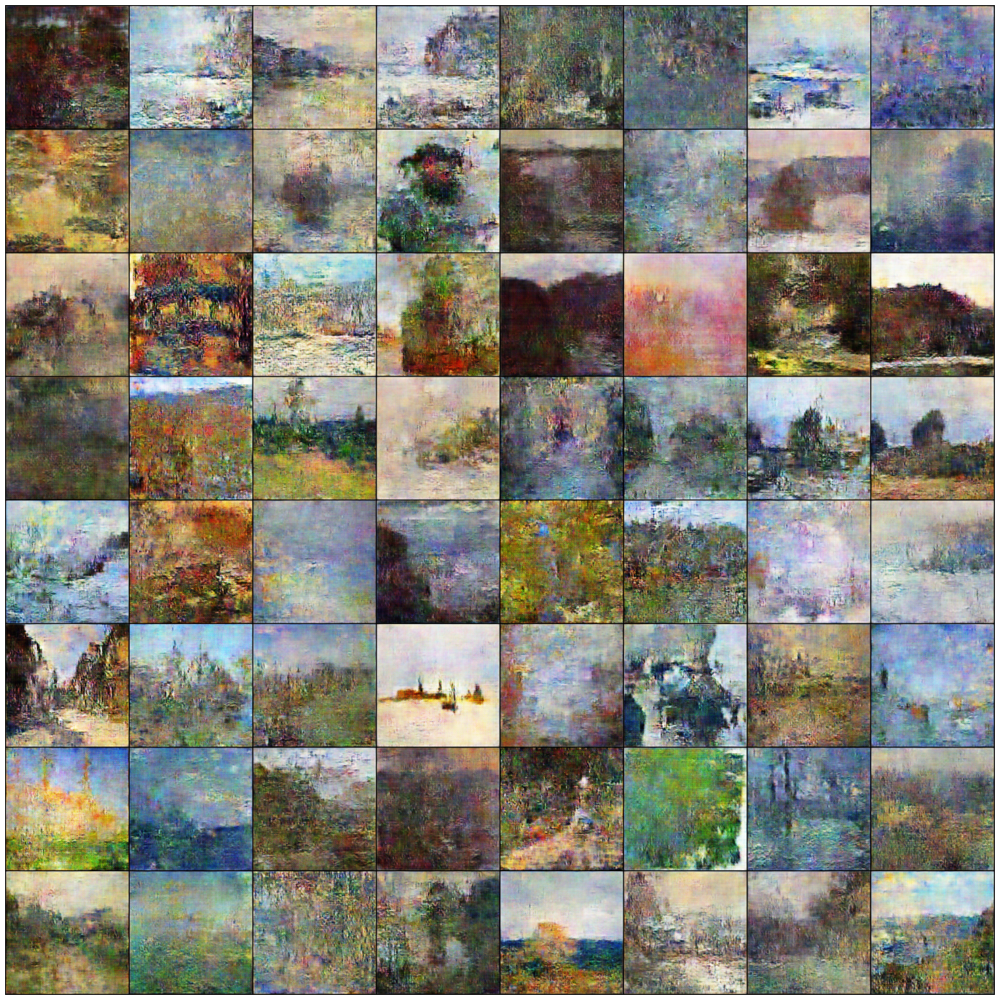

In [ ]:
model.train(dataset, 32500, 64, 500, 10)


In [ ]:
for _ in range(10):
    model.generate_picture(64)

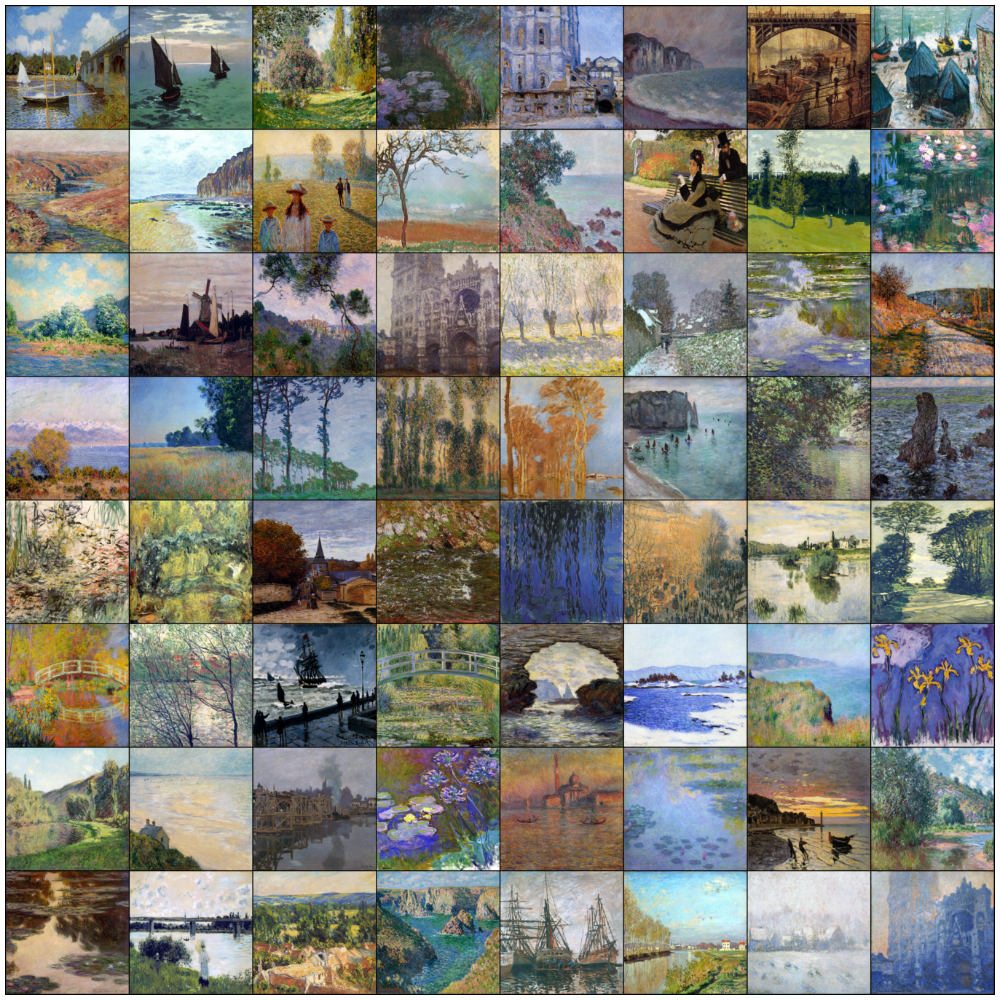

In [ ]:
visualization_batch = torch.tensor(dataset[:64].transpose(0,3,1,2))

model.visualize_batch(visualization_batch)